In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/imagenet/imagenet/"
x = load(os.path.join(path, 'train/ILSVRC2012_val_00005002.JPEG'))
print(x.shape)

(409, 500, 3)


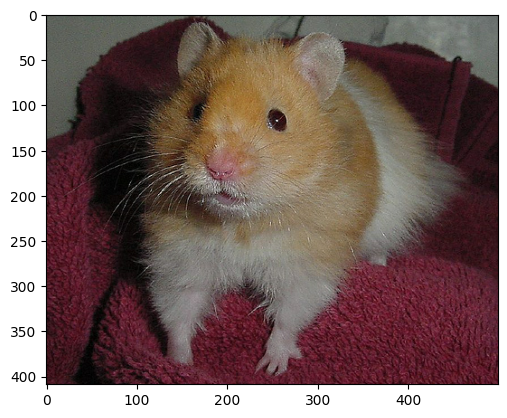

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

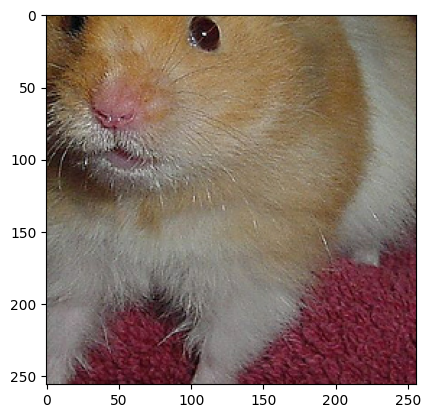

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

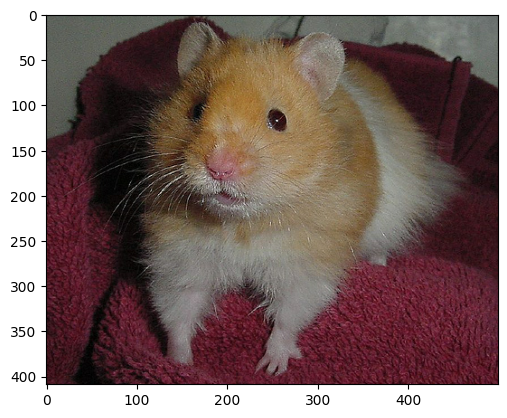

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

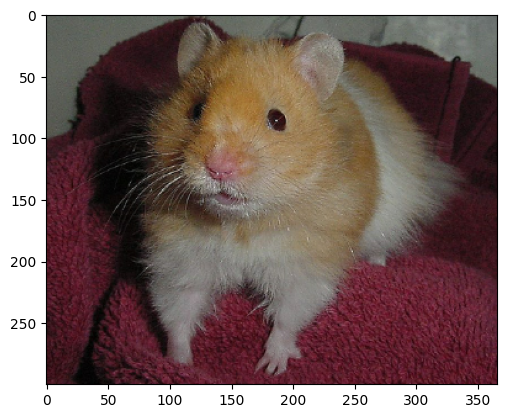

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 12

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.JPEG")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

667

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "val/*.JPEG")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

84

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 205, 250, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 410, 500, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(64, 4, batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4, dropout = True),
        downsample(1024, 4, dropout = True)
    ]


    up_stack = [
        upsample(1024, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4),
        upsample(64, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 64)         1024      ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 128)          131584    ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 256)          525312    ['sequential_3[0][0]']        
                                                                                              

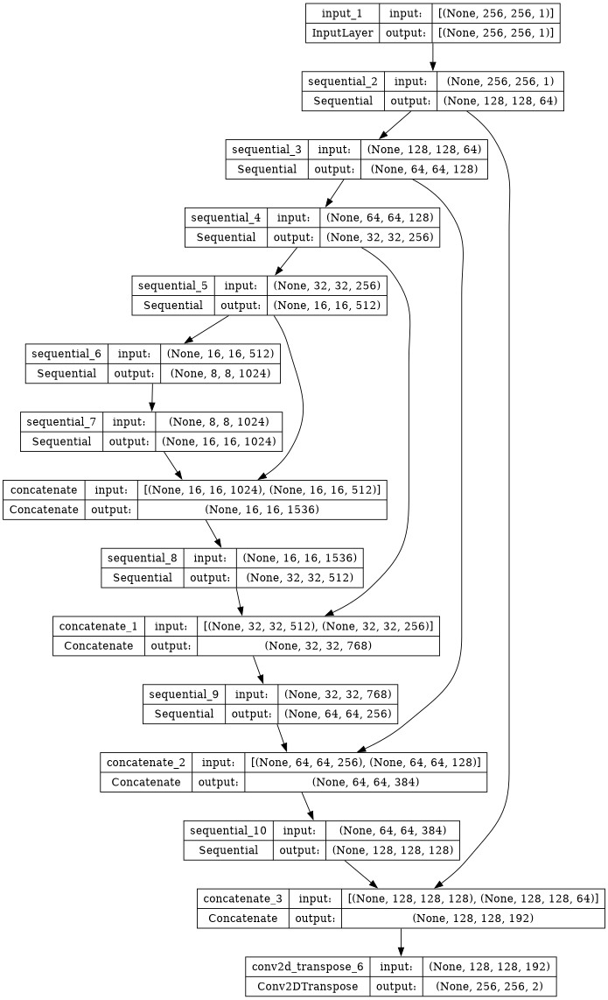

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
# gen.load_weights('/kaggle/input/imagenetmodelweights/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

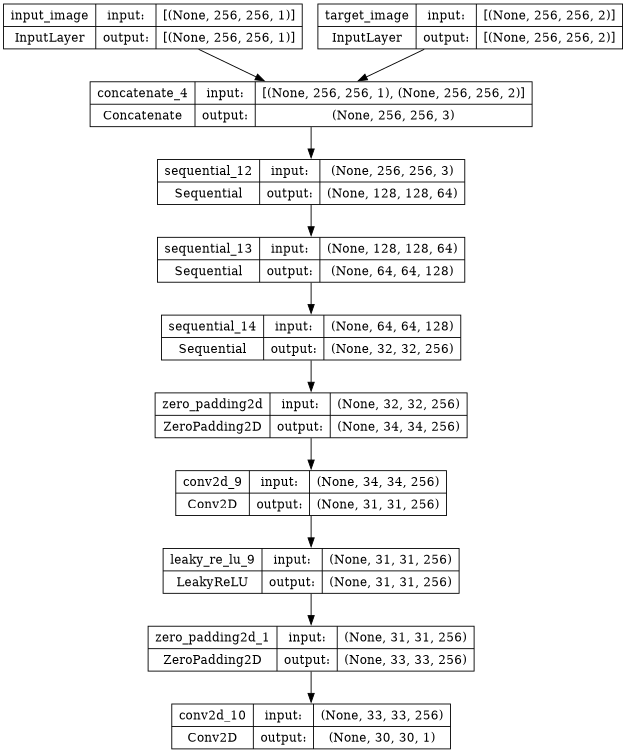

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
# disc.load_weights('/kaggle/input/imagenetmodelweights/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values,psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


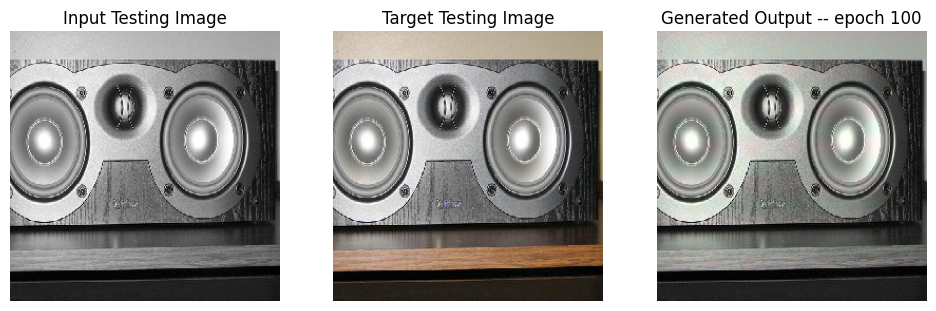

SSIM Score: 0.9223408102989197
PSNR Score: 27.119848251342773


In [47]:
display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000109.JPEG',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000026.JPEG', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 3s 0us/step
Training Details
Generator-- total_loss:11.33687 gan_loss:1.56905 l1_loss:0.05405 perceptual_loss:0.01107 Discriminator-- total_loss:1.10015 real_loss:0.55170 generated_loss:0.54844 --- SSIM 0.81413 PSNR 21.21395 LPIPS 0.00000
Time taken for epoch 1 is 856.4496529102325 sec
Number of iteration 667
Validation Details
Generator-- total_loss:10.46086 gan_loss:0.10582 l1_loss:0.05842  perceptual_loss:0.01061 Discriminator-- total_loss:3.79870 real_loss:3.64054 generated_loss:0.15816 --- SSIM 0.85853 PSNR 20.85302 LPIPS 0.00000
Time taken for epoch 1 is 912.9035713672638 sec
Number of iteration 84
Displaying one random test image...


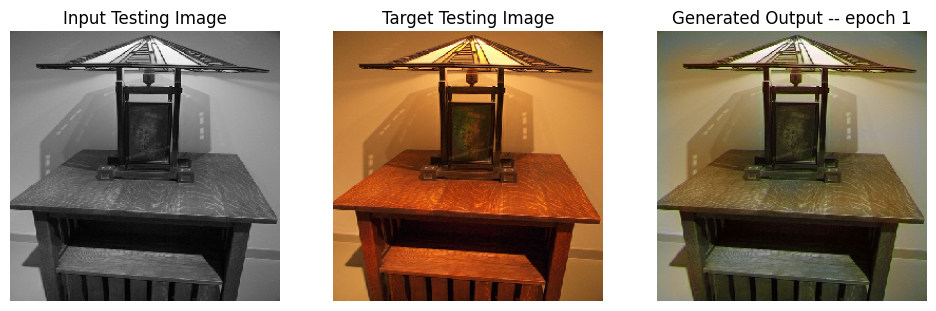

SSIM Score: 0.8144246935844421
PSNR Score: 16.93279457092285
Epoch 1
Training Details
Generator-- total_loss:11.02680 gan_loss:1.68555 l1_loss:0.05231 perceptual_loss:0.00996 Discriminator-- total_loss:1.10470 real_loss:0.54574 generated_loss:0.55896 --- SSIM 0.86318 PSNR 21.40837 LPIPS 0.00000
Time taken for epoch 2 is 842.4033892154694 sec
Number of iteration 667
Validation Details
Generator-- total_loss:9.99637 gan_loss:0.92337 l1_loss:0.04850  perceptual_loss:0.01199 Discriminator-- total_loss:1.63922 real_loss:1.07523 generated_loss:0.56399 --- SSIM 0.89148 PSNR 22.43668 LPIPS 0.00000
Time taken for epoch 2 is 898.3099179267883 sec
Number of iteration 84
Epoch 2
Training Details
Generator-- total_loss:10.75638 gan_loss:1.42773 l1_loss:0.05215 perceptual_loss:0.01005 Discriminator-- total_loss:1.10343 real_loss:0.52303 generated_loss:0.58041 --- SSIM 0.88507 PSNR 21.38727 LPIPS 0.00000
Time taken for epoch 3 is 844.8743124008179 sec
Number of iteration 667
Validation Details
Genera

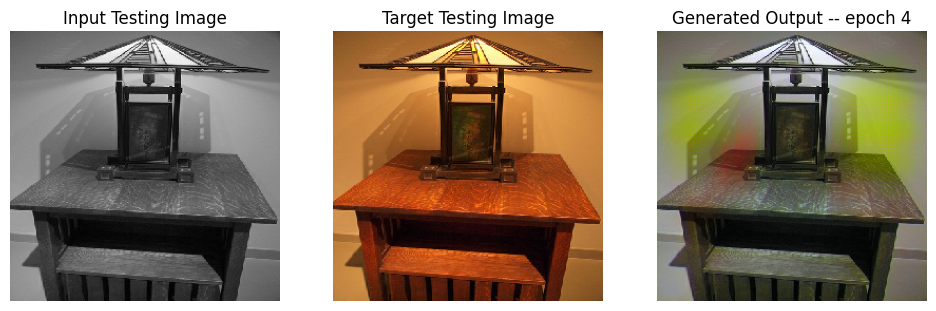

SSIM Score: 0.7527477145195007
PSNR Score: 15.725674629211426
Epoch 4
Training Details
Generator-- total_loss:10.45112 gan_loss:1.37999 l1_loss:0.05092 perceptual_loss:0.00955 Discriminator-- total_loss:1.10778 real_loss:0.52415 generated_loss:0.58363 --- SSIM 0.89048 PSNR 21.54663 LPIPS 0.00000
Time taken for epoch 5 is 835.3810863494873 sec
Number of iteration 667
Validation Details
Generator-- total_loss:11.21827 gan_loss:0.82699 l1_loss:0.05756  perceptual_loss:0.01171 Discriminator-- total_loss:1.83567 real_loss:1.02227 generated_loss:0.81340 --- SSIM 0.88123 PSNR 21.09324 LPIPS 0.00000
Time taken for epoch 5 is 889.9689157009125 sec
Number of iteration 84
Epoch 5
Training Details
Generator-- total_loss:10.58308 gan_loss:1.36984 l1_loss:0.05189 perceptual_loss:0.00953 Discriminator-- total_loss:1.10081 real_loss:0.52346 generated_loss:0.57735 --- SSIM 0.88931 PSNR 21.35459 LPIPS 0.00000
Time taken for epoch 6 is 832.7908215522766 sec
Number of iteration 667
Validation Details
Gene

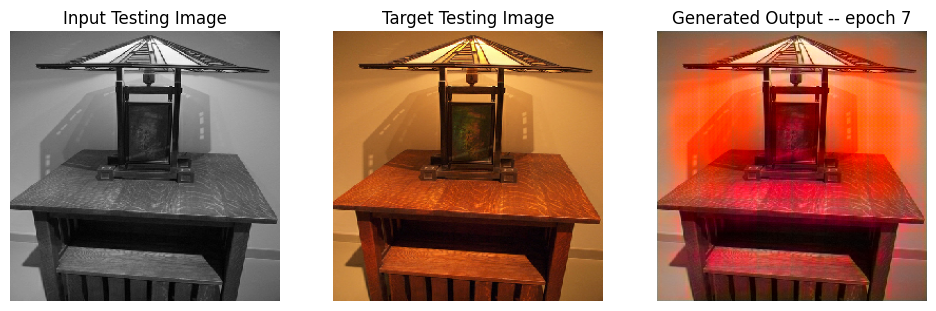

SSIM Score: 0.6631767153739929
PSNR Score: 16.985261917114258
Epoch 7
Training Details
Generator-- total_loss:10.50534 gan_loss:1.29770 l1_loss:0.05161 perceptual_loss:0.00978 Discriminator-- total_loss:1.11821 real_loss:0.52723 generated_loss:0.59098 --- SSIM 0.88881 PSNR 21.37880 LPIPS 0.00000
Time taken for epoch 8 is 834.0613718032837 sec
Number of iteration 667
Validation Details
Generator-- total_loss:39.48634 gan_loss:1.71011 l1_loss:0.23440  perceptual_loss:0.01744 Discriminator-- total_loss:1.16185 real_loss:0.48661 generated_loss:0.67524 --- SSIM 0.61605 PSNR 9.66262 LPIPS 0.00000
Time taken for epoch 8 is 888.2634482383728 sec
Number of iteration 84
Epoch 8
Training Details
Generator-- total_loss:10.46981 gan_loss:1.32786 l1_loss:0.05134 perceptual_loss:0.00960 Discriminator-- total_loss:1.11917 real_loss:0.53456 generated_loss:0.58462 --- SSIM 0.88861 PSNR 21.36908 LPIPS 0.00000
Time taken for epoch 9 is 835.5736420154572 sec
Number of iteration 667
Validation Details
Gener

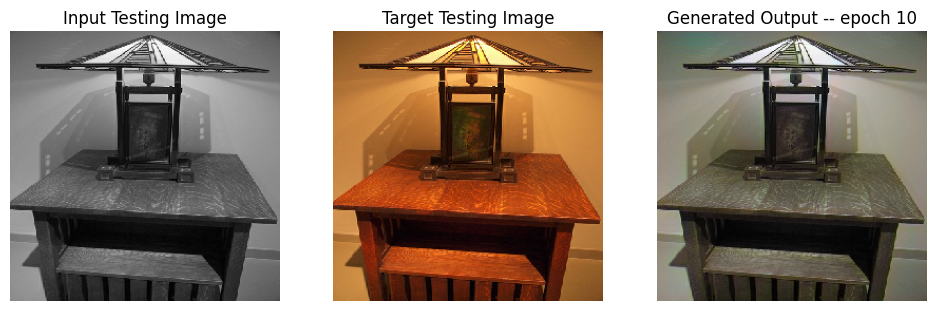

SSIM Score: 0.7985838055610657
PSNR Score: 15.377562522888184
Epoch 10
Training Details
Generator-- total_loss:8.81603 gan_loss:0.76149 l1_loss:0.04457 perceptual_loss:0.00913 Discriminator-- total_loss:1.11743 real_loss:0.73103 generated_loss:0.38640 --- SSIM 0.90630 PSNR 22.49636 LPIPS 0.00000
Time taken for epoch 11 is 723.8157687187195 sec
Number of iteration 667
Validation Details
Generator-- total_loss:9.64262 gan_loss:0.52414 l1_loss:0.05036  perceptual_loss:0.01043 Discriminator-- total_loss:1.51627 real_loss:0.96014 generated_loss:0.55612 --- SSIM 0.90179 PSNR 22.11799 LPIPS 0.00000
Time taken for epoch 11 is 777.978672504425 sec
Number of iteration 84
Epoch 11
Training Details
Generator-- total_loss:16.94104 gan_loss:8.71466 l1_loss:0.04583 perceptual_loss:0.00901 Discriminator-- total_loss:0.01786 real_loss:0.00921 generated_loss:0.00865 --- SSIM 0.90005 PSNR 22.18410 LPIPS 0.00000
Time taken for epoch 12 is 569.1702418327332 sec
Number of iteration 667
Validation Details
Ge

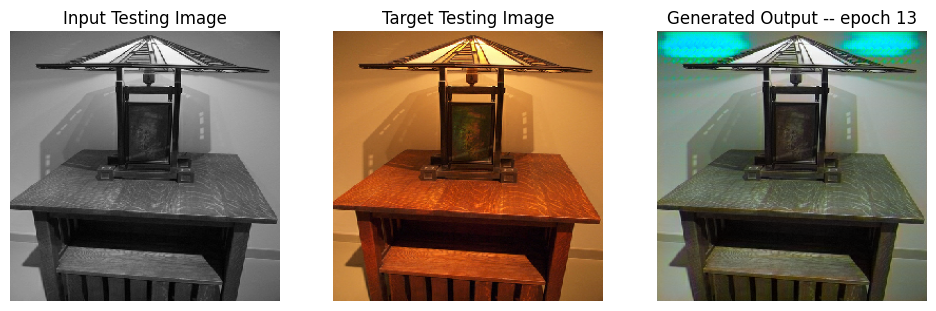

SSIM Score: 0.7297150492668152
PSNR Score: 11.439432144165039
Epoch 13
Training Details
Generator-- total_loss:20.72143 gan_loss:12.51674 l1_loss:0.04561 perceptual_loss:0.00908 Discriminator-- total_loss:0.00075 real_loss:0.00043 generated_loss:0.00032 --- SSIM 0.90059 PSNR 22.19507 LPIPS 0.00000
Time taken for epoch 14 is 570.4219665527344 sec
Number of iteration 667
Validation Details
Generator-- total_loss:11.02056 gan_loss:1.34215 l1_loss:0.05379  perceptual_loss:0.01073 Discriminator-- total_loss:1.44777 real_loss:0.85081 generated_loss:0.59696 --- SSIM 0.89037 PSNR 21.26279 LPIPS 0.00000
Time taken for epoch 14 is 625.4823315143585 sec
Number of iteration 84
Epoch 14
Training Details
Generator-- total_loss:21.91488 gan_loss:13.81814 l1_loss:0.04508 perceptual_loss:0.00890 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00005 --- SSIM 0.90191 PSNR 22.31780 LPIPS 0.00000
Time taken for epoch 15 is 567.2503571510315 sec
Number of iteration 667
Validation Detai

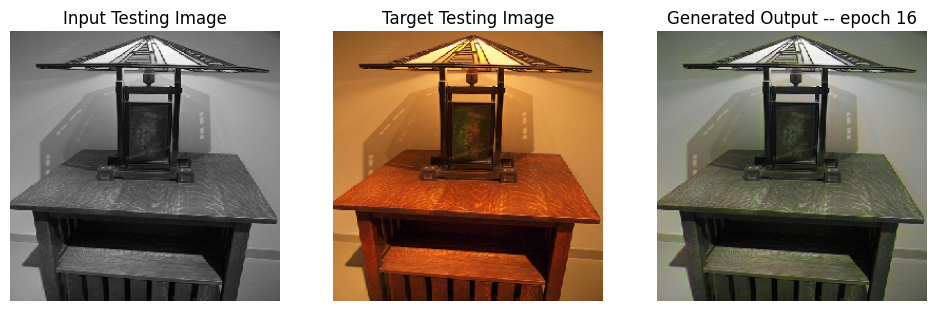

SSIM Score: 0.7912876605987549
PSNR Score: 15.04858684539795
Epoch 16
Training Details
Generator-- total_loss:7.55201 gan_loss:0.03059 l1_loss:0.04166 perceptual_loss:0.00848 Discriminator-- total_loss:7.43430 real_loss:7.43427 generated_loss:0.00004 --- SSIM 0.91710 PSNR 23.57660 LPIPS 0.00000
Time taken for epoch 17 is 724.4383533000946 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.50282 gan_loss:0.00000 l1_loss:0.04680  perceptual_loss:0.00989 Discriminator-- total_loss:18.97660 real_loss:18.97659 generated_loss:0.00001 --- SSIM 0.91342 PSNR 22.91501 LPIPS 0.00000
Time taken for epoch 17 is 779.1350560188293 sec
Number of iteration 84
Epoch 17
Training Details
Generator-- total_loss:7.41164 gan_loss:0.02700 l1_loss:0.04088 perceptual_loss:0.00835 Discriminator-- total_loss:7.43375 real_loss:7.43372 generated_loss:0.00003 --- SSIM 0.91876 PSNR 23.72575 LPIPS 0.00000
Time taken for epoch 18 is 720.6673455238342 sec
Number of iteration 667
Validation Details
G

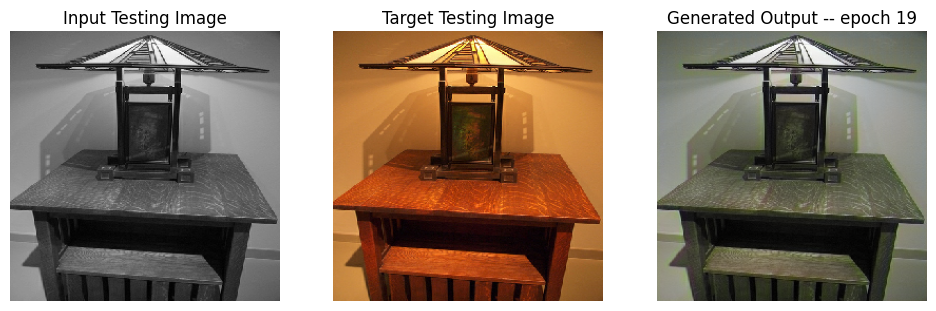

SSIM Score: 0.7897819876670837
PSNR Score: 14.9833402633667
Epoch 19
Training Details
Generator-- total_loss:7.43567 gan_loss:0.02573 l1_loss:0.04107 perceptual_loss:0.00833 Discriminator-- total_loss:7.42281 real_loss:7.42279 generated_loss:0.00002 --- SSIM 0.91890 PSNR 23.67201 LPIPS 0.00000
Time taken for epoch 20 is 722.2612340450287 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.20430 gan_loss:0.00000 l1_loss:0.04506  perceptual_loss:0.00964 Discriminator-- total_loss:19.19102 real_loss:19.19101 generated_loss:0.00001 --- SSIM 0.91540 PSNR 23.33494 LPIPS 0.00000
Time taken for epoch 20 is 776.9390776157379 sec
Number of iteration 84
Epoch 20
Training Details
Generator-- total_loss:7.47568 gan_loss:0.02737 l1_loss:0.04134 perceptual_loss:0.00832 Discriminator-- total_loss:7.08611 real_loss:7.08603 generated_loss:0.00008 --- SSIM 0.91715 PSNR 23.64227 LPIPS 0.00000
Time taken for epoch 21 is 721.4890105724335 sec
Number of iteration 667
Validation Details
Ge

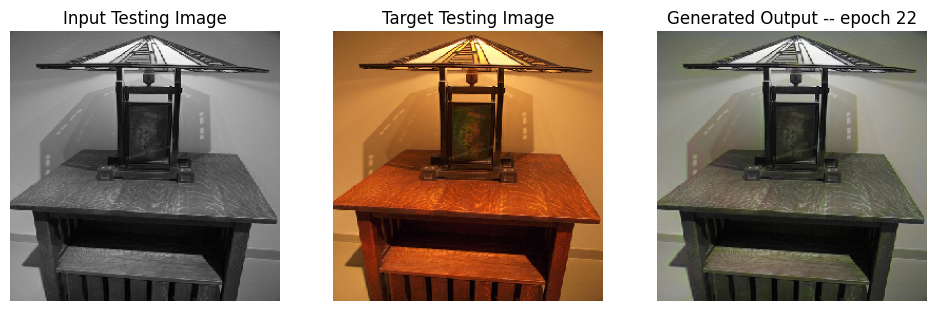

SSIM Score: 0.7923965454101562
PSNR Score: 15.096091270446777
Epoch 22
Training Details
Generator-- total_loss:7.41170 gan_loss:0.02339 l1_loss:0.04098 perceptual_loss:0.00828 Discriminator-- total_loss:7.42960 real_loss:7.42953 generated_loss:0.00007 --- SSIM 0.91765 PSNR 23.70940 LPIPS 0.00000
Time taken for epoch 23 is 718.2311110496521 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.68666 gan_loss:0.00000 l1_loss:0.04666  perceptual_loss:0.01125 Discriminator-- total_loss:18.15781 real_loss:18.15780 generated_loss:0.00001 --- SSIM 0.91295 PSNR 23.07097 LPIPS 0.00000
Time taken for epoch 23 is 771.6168296337128 sec
Number of iteration 84
Epoch 23
Training Details
Generator-- total_loss:7.43205 gan_loss:0.02639 l1_loss:0.04117 perceptual_loss:0.00821 Discriminator-- total_loss:7.23313 real_loss:7.23303 generated_loss:0.00010 --- SSIM 0.91777 PSNR 23.66362 LPIPS 0.00000
Time taken for epoch 24 is 719.5692331790924 sec
Number of iteration 667
Validation Details


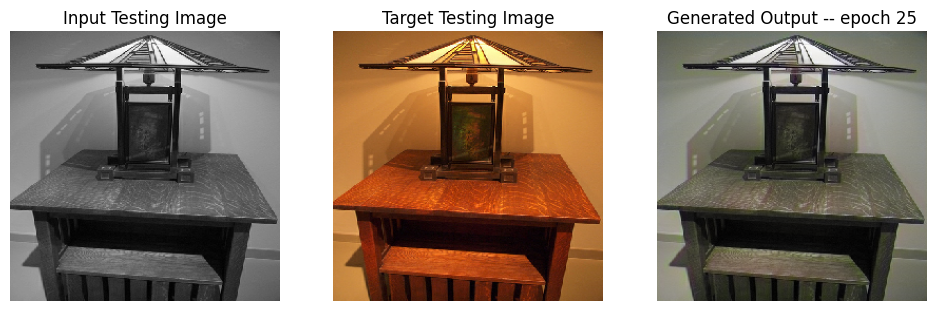

SSIM Score: 0.7931876182556152
PSNR Score: 15.08415699005127
Epoch 25
Training Details
Generator-- total_loss:7.42031 gan_loss:0.02521 l1_loss:0.04107 perceptual_loss:0.00823 Discriminator-- total_loss:7.30351 real_loss:7.30349 generated_loss:0.00002 --- SSIM 0.91852 PSNR 23.70728 LPIPS 0.00000
Time taken for epoch 26 is 716.552809715271 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.12138 gan_loss:0.00000 l1_loss:0.04486  perceptual_loss:0.00929 Discriminator-- total_loss:18.83208 real_loss:18.83206 generated_loss:0.00001 --- SSIM 0.91343 PSNR 23.26784 LPIPS 0.00000
Time taken for epoch 26 is 769.744384765625 sec
Number of iteration 84
Epoch 26
Training Details
Generator-- total_loss:7.44670 gan_loss:0.02578 l1_loss:0.04125 perceptual_loss:0.00823 Discriminator-- total_loss:7.25478 real_loss:7.25477 generated_loss:0.00001 --- SSIM 0.91771 PSNR 23.65819 LPIPS 0.00000
Time taken for epoch 27 is 717.4850001335144 sec
Number of iteration 667
Validation Details
Gen

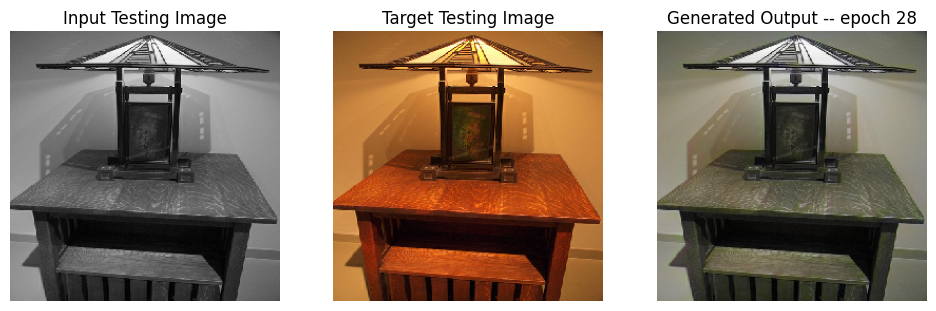

SSIM Score: 0.7986237406730652
PSNR Score: 15.41836929321289
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 28.
Epoch 28
Training Details
Generator-- total_loss:17.17284 gan_loss:9.71163 l1_loss:0.04144 perceptual_loss:0.00830 Discriminator-- total_loss:0.02220 real_loss:0.01925 generated_loss:0.00296 --- SSIM 0.91806 PSNR 23.66834 LPIPS 0.00000
Time taken for epoch 29 is 565.7978110313416 sec
Number of iteration 667
Validation Details
Generator-- total_loss:7.94174 gan_loss:0.00484 l1_loss:0.04349  perceptual_loss:0.00942 Discriminator-- total_loss:6.45897 real_loss:6.45458 generated_loss:0.00439 --- SSIM 0.92163 PSNR 23.67853 LPIPS 0.00000
Time taken for epoch 29 is 619.185558795929 sec
Number of iteration 84
Epoch 29
Training Details
Generator-- total_loss:17.91444 gan_loss:10.58397 l1_loss:0.04073 perceptual_loss:0.00814 Discriminator-- total_loss:0.00085 real_loss:0.00035 generated_loss:0.00050 --- SSIM 0.91952 PSNR 23.76930 LPIPS 0.00000
Time taken for epoc

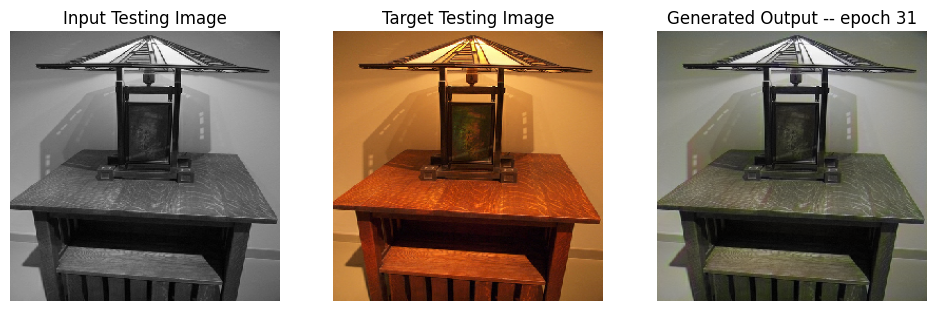

SSIM Score: 0.7934737205505371
PSNR Score: 15.045246124267578
Epoch 31
Training Details
Generator-- total_loss:20.40292 gan_loss:12.99520 l1_loss:0.04108 perceptual_loss:0.00830 Discriminator-- total_loss:0.00010 real_loss:0.00005 generated_loss:0.00006 --- SSIM 0.91902 PSNR 23.69760 LPIPS 0.00000
Time taken for epoch 32 is 569.9398651123047 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.18270 gan_loss:0.00144 l1_loss:0.04500  perceptual_loss:0.00954 Discriminator-- total_loss:8.19515 real_loss:8.19408 generated_loss:0.00107 --- SSIM 0.91402 PSNR 23.32517 LPIPS 0.00000
Time taken for epoch 32 is 623.4840385913849 sec
Number of iteration 84
Epoch 32
Training Details
Generator-- total_loss:20.73299 gan_loss:13.42775 l1_loss:0.04047 perceptual_loss:0.00823 Discriminator-- total_loss:0.00005 real_loss:0.00002 generated_loss:0.00003 --- SSIM 0.92021 PSNR 23.84052 LPIPS 0.00000
Time taken for epoch 33 is 568.028397321701 sec
Number of iteration 667
Validation Details

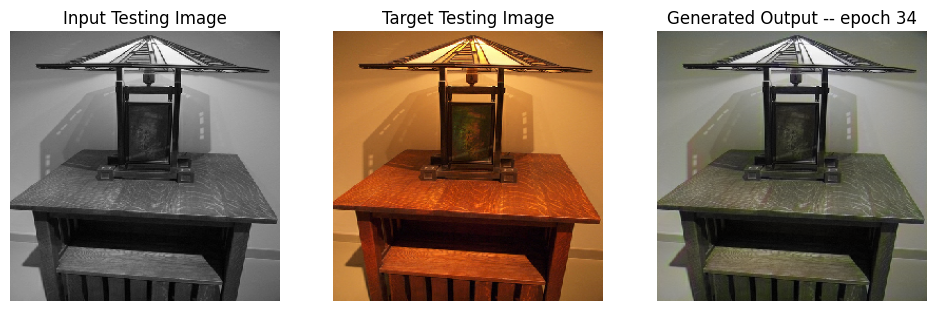

SSIM Score: 0.7933716773986816
PSNR Score: 15.027613639831543
Epoch 34
Training Details
Generator-- total_loss:22.85953 gan_loss:15.50187 l1_loss:0.04084 perceptual_loss:0.00821 Discriminator-- total_loss:0.00021 real_loss:0.00009 generated_loss:0.00012 --- SSIM 0.91817 PSNR 23.76443 LPIPS 0.00000
Time taken for epoch 35 is 569.9964118003845 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.16785 gan_loss:0.00150 l1_loss:0.04498  perceptual_loss:0.00946 Discriminator-- total_loss:9.61831 real_loss:9.61703 generated_loss:0.00128 --- SSIM 0.91655 PSNR 23.24014 LPIPS 0.00000
Time taken for epoch 35 is 623.7636568546295 sec
Number of iteration 84
Epoch 35
Training Details
Generator-- total_loss:23.49567 gan_loss:16.12674 l1_loss:0.04085 perceptual_loss:0.00827 Discriminator-- total_loss:0.00051 real_loss:0.00024 generated_loss:0.00028 --- SSIM 0.91854 PSNR 23.75773 LPIPS 0.00000
Time taken for epoch 36 is 569.2794024944305 sec
Number of iteration 667
Validation Detail

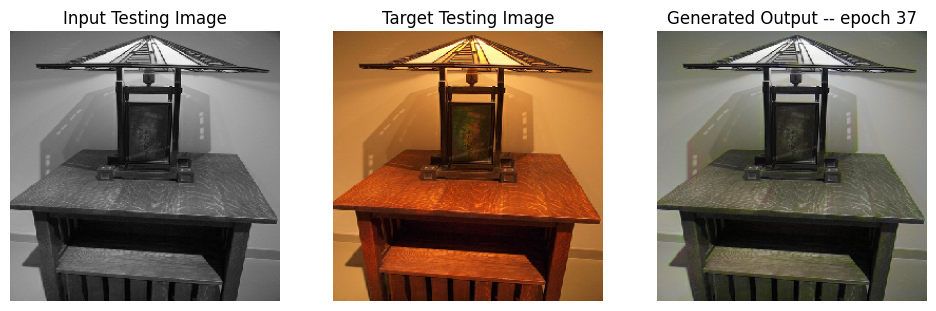

SSIM Score: 0.7933845520019531
PSNR Score: 15.029842376708984
Epoch 37
Training Details
Generator-- total_loss:27.25204 gan_loss:19.85006 l1_loss:0.04111 perceptual_loss:0.00824 Discriminator-- total_loss:0.01819 real_loss:0.01209 generated_loss:0.00610 --- SSIM 0.91920 PSNR 23.69612 LPIPS 0.00000
Time taken for epoch 38 is 568.7903835773468 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.02757 gan_loss:0.00606 l1_loss:0.04393  perceptual_loss:0.00955 Discriminator-- total_loss:7.41457 real_loss:7.40447 generated_loss:0.01010 --- SSIM 0.91745 PSNR 23.50684 LPIPS 0.00000
Time taken for epoch 38 is 623.3957331180573 sec
Number of iteration 84
Epoch 38
Training Details
Generator-- total_loss:27.79444 gan_loss:20.42435 l1_loss:0.04083 perceptual_loss:0.00830 Discriminator-- total_loss:0.00037 real_loss:0.00013 generated_loss:0.00023 --- SSIM 0.91930 PSNR 23.73046 LPIPS 0.00000
Time taken for epoch 39 is 568.8615946769714 sec
Number of iteration 667
Validation Detail

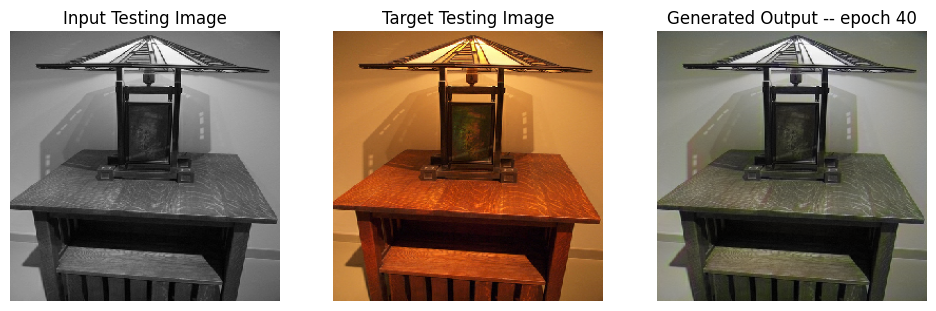

SSIM Score: 0.7935534119606018
PSNR Score: 15.047598838806152
Epoch 40
Training Details
Generator-- total_loss:27.58074 gan_loss:20.20188 l1_loss:0.04089 perceptual_loss:0.00830 Discriminator-- total_loss:0.00007 real_loss:0.00002 generated_loss:0.00005 --- SSIM 0.91918 PSNR 23.72736 LPIPS 0.00000
Time taken for epoch 41 is 565.3671758174896 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.15835 gan_loss:0.00154 l1_loss:0.04471  perceptual_loss:0.00967 Discriminator-- total_loss:9.42482 real_loss:9.42359 generated_loss:0.00123 --- SSIM 0.91599 PSNR 23.42662 LPIPS 0.00000
Time taken for epoch 41 is 618.6459023952484 sec
Number of iteration 84
Epoch 41
Training Details
Generator-- total_loss:27.41023 gan_loss:20.09090 l1_loss:0.04059 perceptual_loss:0.00821 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.92004 PSNR 23.81936 LPIPS 0.00000
Time taken for epoch 42 is 563.2684366703033 sec
Number of iteration 667
Validation Detail

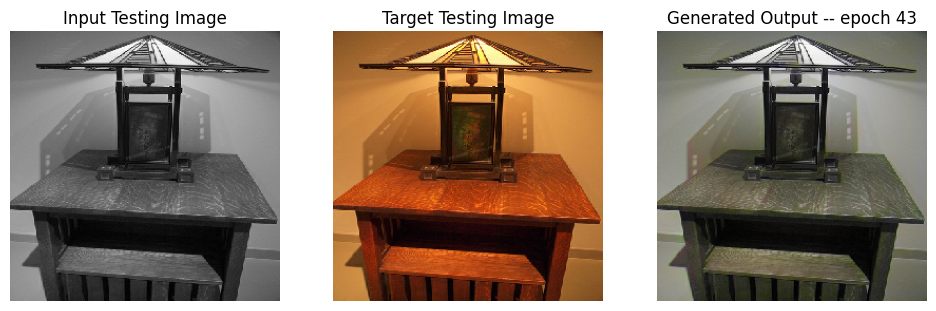

SSIM Score: 0.7936465740203857
PSNR Score: 15.042346000671387
Epoch 43
Training Details
Generator-- total_loss:29.76710 gan_loss:22.30846 l1_loss:0.04143 perceptual_loss:0.00830 Discriminator-- total_loss:0.01312 real_loss:0.00878 generated_loss:0.00434 --- SSIM 0.91862 PSNR 23.67471 LPIPS 0.00000
Time taken for epoch 44 is 565.3589611053467 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.00217 gan_loss:0.00062 l1_loss:0.04388  perceptual_loss:0.00946 Discriminator-- total_loss:11.79909 real_loss:11.79881 generated_loss:0.00027 --- SSIM 0.91577 PSNR 23.37747 LPIPS 0.00000
Time taken for epoch 44 is 618.9380490779877 sec
Number of iteration 84
Epoch 44
Training Details
Generator-- total_loss:30.28515 gan_loss:22.89344 l1_loss:0.04099 perceptual_loss:0.00829 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.91843 PSNR 23.71825 LPIPS 0.00000
Time taken for epoch 45 is 563.9830713272095 sec
Number of iteration 667
Validation Deta

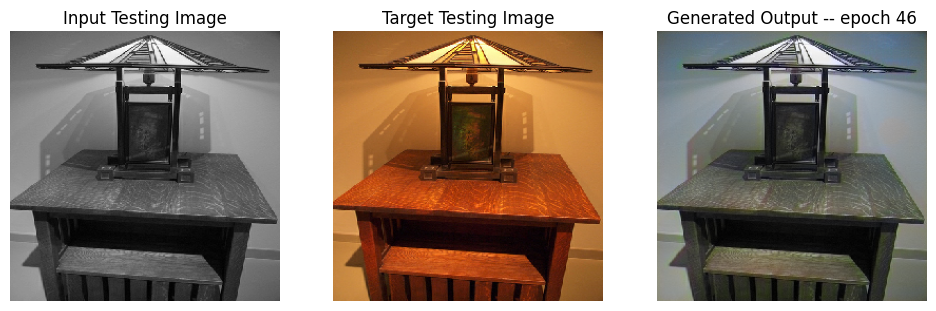

SSIM Score: 0.7730700373649597
PSNR Score: 14.059186935424805
Epoch 46
Training Details
Generator-- total_loss:7.69196 gan_loss:0.03053 l1_loss:0.04280 perceptual_loss:0.00827 Discriminator-- total_loss:16.00275 real_loss:16.00274 generated_loss:0.00001 --- SSIM 0.91458 PSNR 23.18246 LPIPS 0.00000
Time taken for epoch 47 is 719.5406980514526 sec
Number of iteration 667
Validation Details
Generator-- total_loss:9.55966 gan_loss:0.00001 l1_loss:0.05346  perceptual_loss:0.01027 Discriminator-- total_loss:23.41922 real_loss:23.41920 generated_loss:0.00002 --- SSIM 0.90079 PSNR 21.96754 LPIPS 0.00000
Time taken for epoch 47 is 773.1607754230499 sec
Number of iteration 84
Epoch 47
Training Details
Generator-- total_loss:7.66152 gan_loss:0.02563 l1_loss:0.04263 perceptual_loss:0.00828 Discriminator-- total_loss:14.66897 real_loss:14.66872 generated_loss:0.00025 --- SSIM 0.91436 PSNR 23.25783 LPIPS 0.00000
Time taken for epoch 48 is 714.181134223938 sec
Number of iteration 667
Validation Detai

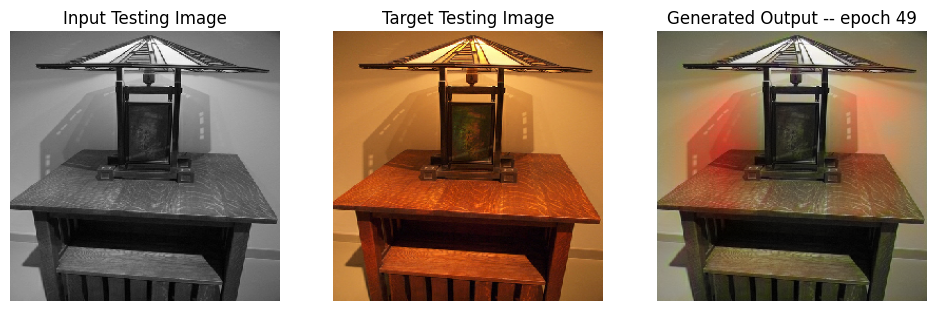

SSIM Score: 0.8284039497375488
PSNR Score: 18.231475830078125
Epoch 49
Training Details
Generator-- total_loss:7.70835 gan_loss:0.02326 l1_loss:0.04303 perceptual_loss:0.00820 Discriminator-- total_loss:13.86426 real_loss:13.86425 generated_loss:0.00000 --- SSIM 0.91315 PSNR 23.18954 LPIPS 0.00000
Time taken for epoch 50 is 714.8829307556152 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.54741 gan_loss:0.00002 l1_loss:0.04749  perceptual_loss:0.00949 Discriminator-- total_loss:20.85597 real_loss:20.85595 generated_loss:0.00003 --- SSIM 0.91188 PSNR 22.90412 LPIPS 0.00000
Time taken for epoch 50 is 768.939670085907 sec
Number of iteration 84
Epoch 50
Training Details
Generator-- total_loss:7.53327 gan_loss:0.02250 l1_loss:0.04186 perceptual_loss:0.00821 Discriminator-- total_loss:13.44741 real_loss:13.44740 generated_loss:0.00001 --- SSIM 0.91567 PSNR 23.34924 LPIPS 0.00000
Time taken for epoch 51 is 718.3820748329163 sec
Number of iteration 667
Validation Detai

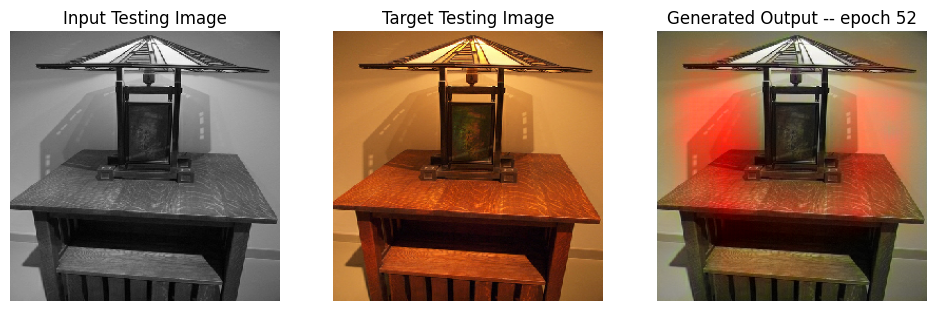

SSIM Score: 0.8116490244865417
PSNR Score: 19.202381134033203
Epoch 52
Training Details
Generator-- total_loss:7.57835 gan_loss:0.02223 l1_loss:0.04222 perceptual_loss:0.00816 Discriminator-- total_loss:13.16438 real_loss:13.16437 generated_loss:0.00001 --- SSIM 0.91539 PSNR 23.30830 LPIPS 0.00000
Time taken for epoch 53 is 717.647127866745 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.59930 gan_loss:0.00004 l1_loss:0.04759  perceptual_loss:0.00974 Discriminator-- total_loss:18.73669 real_loss:18.73667 generated_loss:0.00002 --- SSIM 0.90931 PSNR 22.92335 LPIPS 0.00000
Time taken for epoch 53 is 771.2591478824615 sec
Number of iteration 84
Epoch 53
Training Details
Generator-- total_loss:7.52960 gan_loss:0.02280 l1_loss:0.04192 perceptual_loss:0.00812 Discriminator-- total_loss:13.39727 real_loss:13.39727 generated_loss:0.00001 --- SSIM 0.91513 PSNR 23.32466 LPIPS 0.00000
Time taken for epoch 54 is 715.4768397808075 sec
Number of iteration 667
Validation Detai

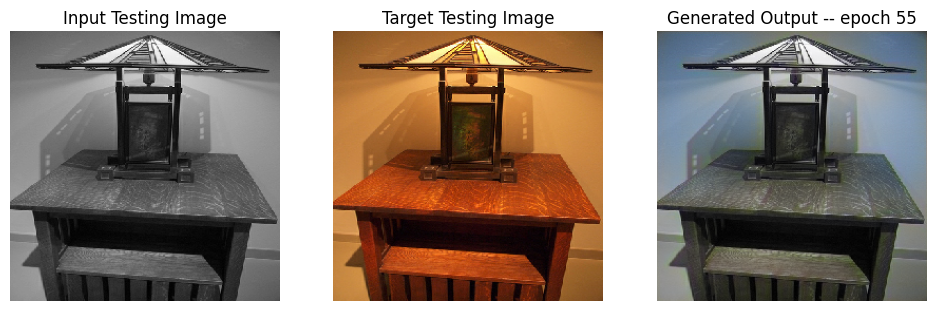

SSIM Score: 0.7640838623046875
PSNR Score: 13.402451515197754
Epoch 55
Training Details
Generator-- total_loss:7.63066 gan_loss:0.02055 l1_loss:0.04257 perceptual_loss:0.00817 Discriminator-- total_loss:12.57506 real_loss:12.57504 generated_loss:0.00001 --- SSIM 0.91298 PSNR 23.23157 LPIPS 0.00000
Time taken for epoch 56 is 716.6517457962036 sec
Number of iteration 667
Validation Details
Generator-- total_loss:8.19944 gan_loss:0.00006 l1_loss:0.04536  perceptual_loss:0.00930 Discriminator-- total_loss:17.99324 real_loss:17.99322 generated_loss:0.00003 --- SSIM 0.91398 PSNR 23.14006 LPIPS 0.00000
Time taken for epoch 56 is 771.0845723152161 sec
Number of iteration 84


In [50]:
fit(train_dataset, epochs, val, gen)

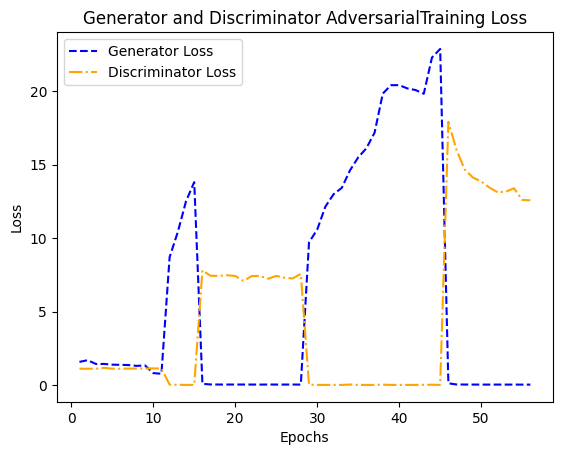

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

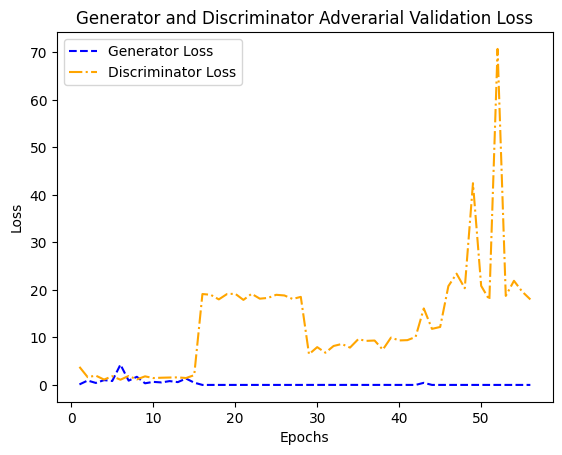

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

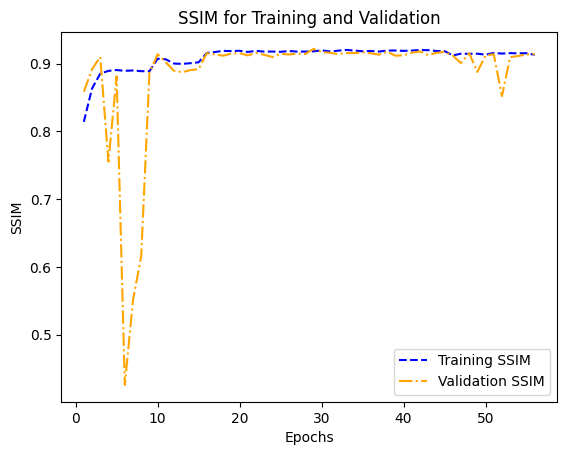

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

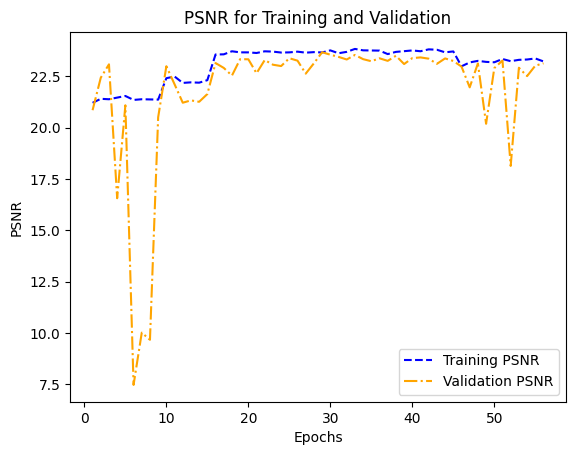

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

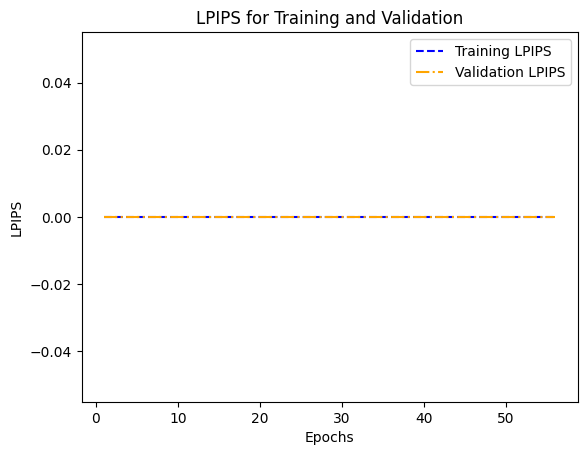

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

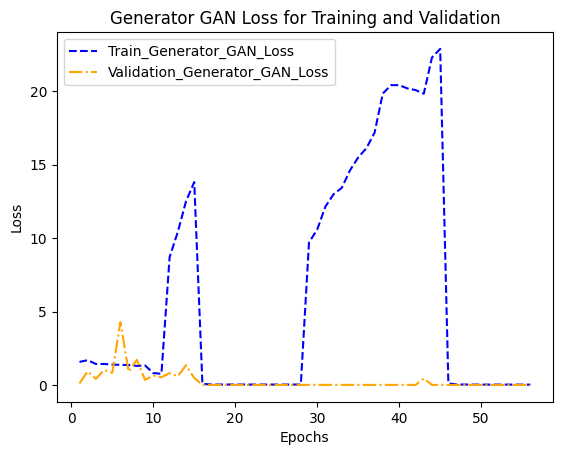

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

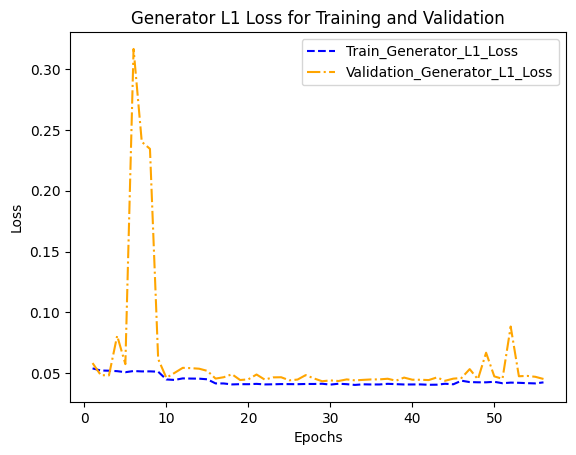

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

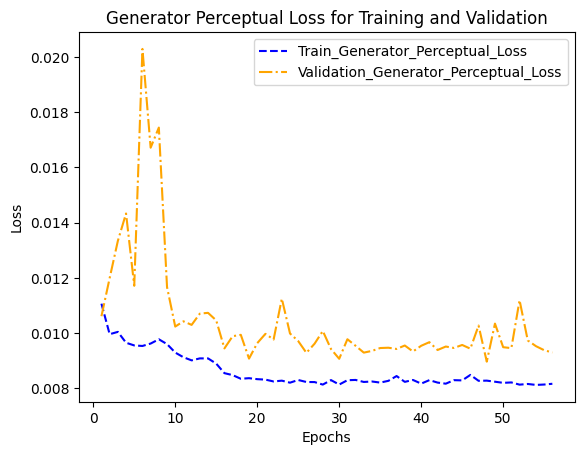

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

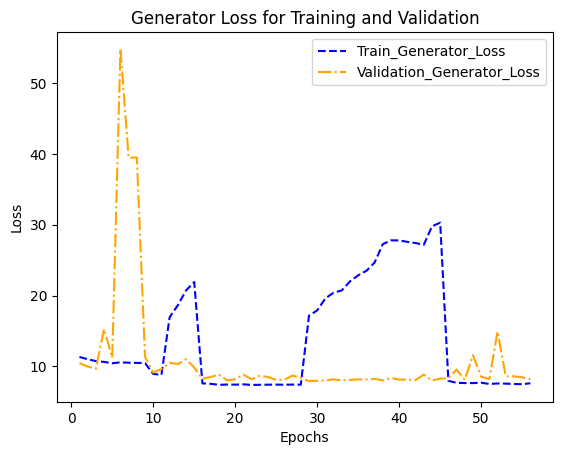

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

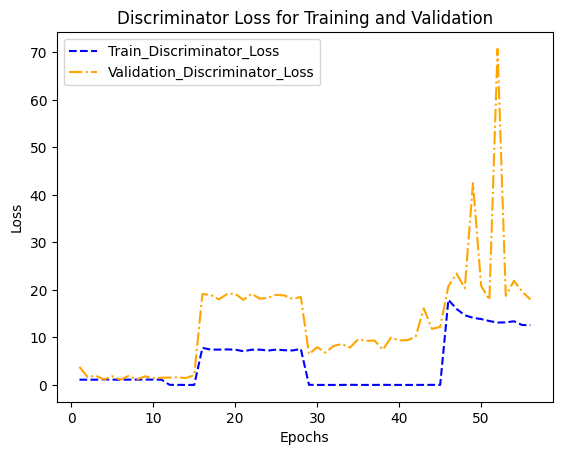

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

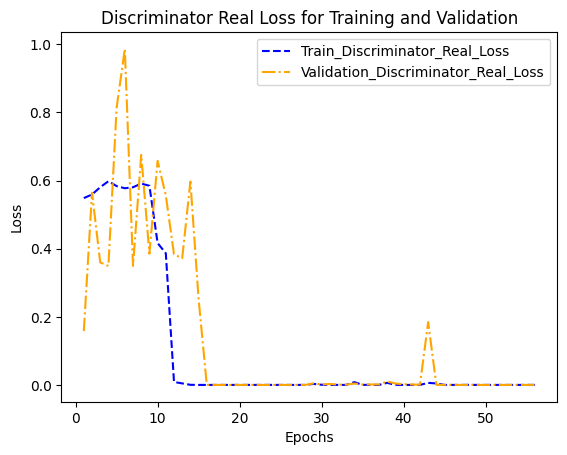

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

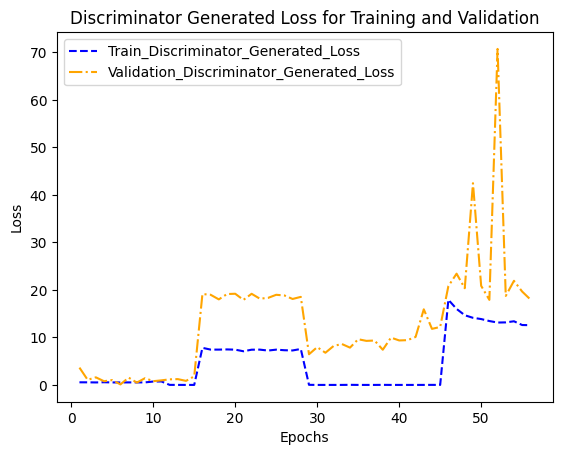

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip